<a href="https://colab.research.google.com/github/cappelchi/calcio_notebooks/blob/main/report/football_live_cv_multiclass_report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Делает отчет по предиктам в мультиклассе и визуализрует результат<br>
Важные переменные

In [1]:
remove_list = ['A1relativ', 'A2relativ', 'DA1relativ', 'DA2relativ'] #Ненужные фичи для предикта
selected_model_version = 6 #6 #2 Номер модели
folded = True #True #False # Модель на фолдах или нет

### Project config

In [2]:
try:
    import neptune
except:
    !pip install neptune >> None
    import neptune
#from neptune.new.integrations.tensorflow_keras import NeptuneCallback
def get_credential(frmwork = 'neptune_team'):
    with open('credential.txt', 'r') as container:
        for line in container:
            if frmwork in line:
                login, psw = line.split(' ')[1], line.split(' ')[2].split('\n')[0]
                return login, psw

In [3]:
#@title Set API key for neptune.ai
set_api = True #@param {type:"boolean"}
if set_api:
    username, api_key = get_credential()

### Installations

In [4]:
!pip install catboost >> None

In [5]:
# install orca
!wget https://github.com/plotly/orca/releases/download/v1.2.1/orca-1.2.1-x86_64.AppImage -q -O /usr/local/bin/orca
!chmod +x /usr/local/bin/orca
!apt-get install xvfb libgtk2.0-0 libgconf-2-4 >> None

### Downloads

In [6]:
#!wget -q -O ./data.rar https://getfile.dokpub.com/yandex/get/...здесь линк на холдаут
#!unrar x ./data.rar ./ >> None
#!mv ./FirstTime ./Result2

In [7]:
data_230623 = False
if data_230623:
    !wget -q -O ./data.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/6vXdKjlPrjHYfw
    !unrar x ./data.rar ./ >> None
    !mv ./StatsByStrOutput ./Result2

    !wget -q -O ./Prem.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/j0KaPC-p-aqvPA
    !unrar x ./Prem.rar ./ >> None

    !wget -q -O ./index.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/uyP8DHKyS7xwvQ
    !unrar x ./index.rar ./ >> None

In [8]:
data_230624 = False
if data_230624:
    !wget -q -O ./data.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/jREDtq9zENy_Kg
    !unrar x ./data.rar ./ >> None
    !mv ./RealStatsOutput ./Result2

    !wget -q -O ./Prem.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/j0KaPC-p-aqvPA
    !unrar x ./Prem.rar ./ >> None

    !wget -q -O ./index.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/uyP8DHKyS7xwvQ
    !unrar x ./index.rar ./ >> None

In [9]:
data_230718 = True
if data_230718:
    !wget -q -O ./data.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/p-WPqPGtt3XAAg
    !unrar x ./data.rar ./ >> None
    !mv ./RealStatsOutput ./Result2

    !wget -q -O ./Prem.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/r-0ho4pGcDHB1w
    !unrar x ./Prem.rar ./ >> None

    !wget -q -O ./index.rar https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/Gzj4j6FAk_2kLA
    !unrar x ./index.rar ./ >> None

### Imports

In [10]:
import pandas as pd
import numpy as np
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100
print(pd.__version__)
print(np.__version__)

1.5.3
1.22.4


In [11]:
np.iinfo(np.int8).max, np.iinfo(np.int16).max, np.iinfo(np.int32).max

(127, 32767, 2147483647)

In [12]:
np.finfo(np.float16).precision, np.finfo(np.float32).precision, np.finfo(np.float64).precision

(3, 6, 15)

In [13]:
import os, psutil, time
from glob import glob
from tqdm import tqdm
import functools

In [14]:
from catboost import CatBoost

### Code

#####Functions

In [15]:
def define_files_list(date_start:str, folder:str, date_end = '') -> list:
    '''
    data_start, data_end
    folder: ./folder/
    '''
    if date_end == '':
        return sorted(
            [file
            for file in glob(folder + '*')
            if int(file.split('/')[-1].split('.csv')[0]) >= int(date_start)]
            )
    else:
        return sorted(
            [file
            for file in glob(folder + '*')
            if int(file.split('/')[-1].split('.csv')[0]) >= int(date_start) & \
                int(file.split('/')[-1].split('.csv')[0]) <= int(date_end)]
            )

In [16]:
def create_id_dict(date_start, folder, cols, date_end = '') -> dict:
    '''
    '''
    return pd.concat(map(
        functools.partial(
            pd.read_csv, sep=';', usecols =  cols
                            ),
                    define_files_list(date_start, folder, date_end = date_end)
                    ), ignore_index=True).drop_duplicates(subset = ['Id'], keep = 'last').set_index('Id').to_dict(orient = 'index')

In [17]:
def transform_dataset(data_df:pd.DataFrame, remain = []):
    new_match_vector = data_df['Id'] != data_df['Id'].shift(1)
    # трансформируем минуты
    data_df['min_norm'] = data_df['Minute'].astype(np.float32) / 50
    print('1. Минуты посчитаны...')
    # трансформируем голы
    data_df[data_df['Score1'].isna() & new_match_vector] = 0
    data_df['Score1_norm'] = data_df['Score1'].fillna(method = 'ffill').astype(np.float32) / 4
    data_df.loc[data_df['Score1'] > 3, ['Score1_norm']] = 1.0
    data_df[data_df['Score2'].isna() & new_match_vector] = 0
    data_df['Score2_norm'] = data_df['Score2'].fillna(method = 'ffill').astype(np.float32) / 4
    data_df.loc[data_df['Score2'] > 3, ['Score2_norm']] = 1.0

    data_df['Score_diff'] = data_df['Score1'].astype(np.int16) - data_df['Score2'].astype(np.int16)
    data_df.loc[data_df['Score_diff'] < -4, ['Score_diff']] = -4
    data_df.loc[data_df['Score_diff'] > 4, ['Score_diff']] = 4
    data_df[[f'Score_cat_{n}' for n in range(1, 10)]] = pd.get_dummies(data_df['Score_diff']).values
    data_df['Score_diff'] = data_df['Score_diff'].astype(np.float32) / np.float32(4.0)
    if 'Score1' not in remain:
        data_df = data_df.drop(['Score1', 'Score2'], axis = 1)
    print('2. Голы посчитаны...')
    #трансформируем атаки
    data_df['A1_scaled'] = data_df['A1'].astype(np.float32) / 75
    data_df.loc[data_df['A1'] >= 60, ['A1_scaled']] = (60 + (data_df['A1'] - 60) / 4) / 75
    data_df['A2_scaled'] = data_df['A2'].astype(np.float32) / 75
    data_df.loc[data_df['A2'] >= 60, ['A2_scaled']] = (60 + (data_df['A2'] - 60) / 4) / 75
    # атаки в минуту
    data_df['A1perMIN'] = data_df['A1'].astype(np.float32) / data_df['Minute'].astype(np.float32)
    data_df.loc[data_df['A1perMIN'] > 4, ['A1perMIN']] = np.float32(4.0)
    data_df['A2perMIN'] = data_df['A2'].astype(np.float32) / data_df['Minute'].astype(np.float32)
    data_df.loc[data_df['A2perMIN'] > 4, ['A2perMIN']] = np.float32(4.0)
    # динамика атак
    new_match_vector5 = data_df['Id'] != data_df['Id'].shift(5)
    data_df['A1relativ'] = data_df['A1'].astype(np.float32) - data_df['A1'].shift(5).astype(np.float32)
    data_df.loc[new_match_vector5, ['A1relativ']] = np.float32(0.0)
    data_df['A1relativ'] = data_df['A1relativ'].fillna(0)
    data_df.loc[data_df['A1relativ'] > 15, ['A1relativ']] = np.float32(15.)
    data_df['A2relativ'] = data_df['A2'].astype(np.float32) - data_df['A2'].shift(5).astype(np.float32)
    data_df.loc[new_match_vector5, ['A2relativ']] =  np.float32(0.0)
    data_df['A2relativ'] = data_df['A2relativ'].fillna(0)
    data_df.loc[data_df['A2relativ'] > 15, ['A2relativ']] = np.float32(15.)
    if 'A1' not in remain:
        data_df = data_df.drop(['A1', 'A2'], axis = 1)
    print('3. Атаки посчитаны...')
    # трансформируем опасные атаки
    data_df['DA1_scaled'] = data_df['DA1'].astype(np.float32) / 50
    data_df.loc[data_df['DA1'] >= 40, ['DA1_scaled']] = (80 + (data_df['DA1'] - 40) / 3) / 100
    data_df['DA2_scaled'] = data_df['DA2'].astype(np.float32) / 50
    data_df.loc[data_df['DA2'] >= 40, ['DA2_scaled']] = (80 + (data_df['DA2'] - 40) / 3) / 100
    # опасные атаки в минуту
    data_df['DA1perMIN'] = data_df['DA1'].astype(np.float32) / data_df['Minute'].astype(np.float32)
    data_df.loc[data_df['DA1perMIN'] > 3, ['DA1perMIN']] = np.float32(3.0)
    data_df['DA2perMIN'] = data_df['DA2'].astype(np.float32) / data_df['Minute'].astype(np.float32)
    data_df.loc[data_df['DA2perMIN'] > 3, ['DA2perMIN']] = np.float32(3.0)
    # динамика опасных атак
    data_df['DA1relativ'] = data_df['DA1'].astype(np.float32) - data_df['DA1'].shift(5).astype(np.float32)
    data_df.loc[new_match_vector5, ['DA1relativ']] = np.float32(0.0)
    data_df['DA1relativ'] = data_df['DA1relativ'].fillna(0)
    data_df.loc[data_df['DA1relativ'] > 10, ['DA1relativ']] = np.float32(10.)
    data_df['DA2relativ'] = data_df['DA2'].astype(np.float32) - data_df['DA2'].shift(5).astype(np.float32)
    data_df.loc[new_match_vector5, ['DA2relativ']] = np.float32(0.0)
    data_df['DA2relativ'] = data_df['DA2relativ'].fillna(0)
    data_df.loc[data_df['DA2relativ'] > 10, ['DA2relativ']] = np.float32(10.)
    if 'DA1' not in remain:
        data_df = data_df.drop(['DA1', 'DA2'], axis = 1)
    if 'Minute' not in remain:
        data_df = data_df.drop(['Minute'], axis = 1)
    print('4. Опасные атаки посчитаны...')
    # трансформируем владение мячом
    data_df[data_df['Pos1'].isna() & new_match_vector] = 0
    data_df['Pos1_cleaned'] = data_df['Pos1'].fillna(method = 'ffill').astype(np.float32) /  np.float32(100.0)
    data_df.loc[data_df['Pos1_cleaned'] < 0.2, ['Pos1_cleaned']] = np.float32(0.2)
    data_df.loc[data_df['Pos1_cleaned'] > 0.8, ['Pos1_cleaned']] = np.float32(0.8)
    data_df[data_df['Pos2'].isna() & new_match_vector] = 0
    data_df['Pos2_cleaned'] = data_df['Pos2'].fillna(method = 'ffill').astype(np.float32) /  np.float32(100.0)
    data_df.loc[data_df['Pos2_cleaned'] < 0.2, ['Pos2_cleaned']] = np.float32(0.2)
    data_df.loc[data_df['Pos2_cleaned'] > 0.8, ['Pos2_cleaned']] = np.float32(0.8)
    if 'Pos1' not in remain:
        data_df = data_df.drop(['Pos1', 'Pos2'], axis = 1)
    print('5. Владение мячом посчитпно...')
    # трансформируем удары
    data_df[data_df['Off1'].isna() & new_match_vector] = 0
    data_df['Off1_norm'] = data_df['Off1'].fillna(method = 'ffill').astype(np.float32) / np.float32(10.0)
    data_df.loc[data_df['Off1_norm'] > 1.0, ['Off1_norm']] = np.float32(1.0)
    data_df[data_df['Off2'].isna() & new_match_vector] = 0
    data_df['Off2_norm'] = data_df['Off2'].fillna(method = 'ffill').astype(np.float32) / np.float32(10.0)
    data_df.loc[data_df['Off2_norm'] > 1.0, ['Off2_norm']] = np.float32(1.0)
    if 'Off1' not in remain:
        data_df = data_df.drop(['Off1', 'Off2'], axis = 1)
    print('6. Удары посчитаны...')
    # трансформируем удары в створ
    data_df[data_df['On1'].isna() & new_match_vector] = 0
    data_df['On1_norm'] = data_df['On1'].fillna(method = 'ffill').astype(np.float32) / np.float32(5.0)
    data_df.loc[data_df['On1_norm'] > 1.0, ['On1_norm']] = np.float32(1.0)
    data_df[data_df['On2'].isna() & new_match_vector] = 0
    data_df['On2_norm'] = data_df['On2'].fillna(method = 'ffill').astype(np.float32) / np.float32(5.0)
    data_df.loc[data_df['On2_norm'] > 1.0, ['On2_norm']] = np.float32(1.0)
    if 'On1' not in remain:
        data_df = data_df.drop(['On1', 'On2'], axis = 1)
    print('7. Удары в створ посчитаны...')
    # трансформируем желтые карточки
    data_df[data_df['YC1'].isna() & new_match_vector] = 0
    data_df['YC1_transformed'] = data_df['YC1'].fillna(0).astype(np.float32) / np.float32(2.0)
    data_df.loc[data_df['YC1_transformed'] > 1.0, ['YC1_transformed']] = np.float32(1.0)
    data_df[data_df['YC2'].isna() & new_match_vector] = 0
    data_df['YC2_transformed'] = data_df['YC2'].fillna(0).astype(np.float32) / np.float32(2.0)
    data_df.loc[data_df['YC2_transformed'] > 1.0, ['YC2_transformed']] = np.float32(1.0)
    if 'YC1' not in remain:
        data_df = data_df.drop(['YC1', 'YC2'], axis = 1)
    print('8. Жёлтые карточки посчитаны...')
    # трансформируем красные карточки
    data_df[data_df['RC1'].isna() & new_match_vector] = 0
    data_df['RC1_transformed'] = data_df['RC1'].fillna(0).astype(np.int8)
    data_df.loc[data_df['RC1_transformed'] > 1, ['RC1_transformed']] = np.int8(1)
    data_df[data_df['RC2'].isna() & new_match_vector] = 0
    data_df['RC2_transformed'] = data_df['RC2'].fillna(0).astype(np.int8)
    data_df.loc[data_df['RC2_transformed'] > 1, ['RC2_transformed']] = np.int8(1)
    if 'RC1' not in remain:
        data_df = data_df.drop(['RC1', 'RC2'], axis = 1)
    print('9. Красные карточки посчитаны...')
    # трансформируем замены
    data_df[data_df['Sub1'].isna() & new_match_vector] = 0
    data_df['Sub1_transformed'] = data_df['Sub1'].fillna(0).astype(np.int8)
    data_df.loc[data_df['Sub1_transformed'] > 1, ['Sub1_transformed']] = np.int8(1)
    data_df[data_df['Sub2'].isna() & new_match_vector] = 0
    data_df['Sub2_transformed'] = data_df['Sub2'].fillna(0).astype(np.int8)
    data_df.loc[data_df['Sub2_transformed'] > 1, ['Sub2_transformed']] = np.int8(1)
    if 'Sub1' not in remain:
        data_df = data_df.drop(['Sub1', 'Sub2'], axis = 1)
    print('10. Замены посчитаны...')
    # трансформируем угловык
    data_df[data_df['Cor1'].isna() & new_match_vector] = 0
    data_df['Cor1_transformed'] = data_df['Cor1'].fillna(0).astype(np.float32) / np.float32(6.0)
    data_df.loc[data_df['Cor1_transformed'] > 1.0, ['Cor1_transformed']] = np.float32(1.0)
    data_df[data_df['Cor2'].isna() & new_match_vector] = 0
    data_df['Cor2_transformed'] = data_df['Cor2'].fillna(0).astype(np.float32) / np.float32(6.0)
    data_df.loc[data_df['Cor2_transformed'] > 1.0, ['Cor2_transformed']] = np.float32(1.0)
    if 'Cor1' not in remain:
        data_df = data_df.drop(['Cor1', 'Cor2'], axis = 1)
    print('11. Угловые посчитаны...')
    # трансформируем линию
    data_df['P1_transformed'] = np.log(data_df['P1'], dtype = np.float32) / 2
    data_df['P2_transformed'] = np.log(data_df['P2'], dtype = np.float32) / 2
    if 'P1' not in remain:
        data_df = data_df.drop(['P1', 'P2'], axis = 1)
    print('12. Линии посчитаны...')
    if 'Pen1' not in remain:
        data_df = data_df.drop(['Pen1', 'Pen2'], axis = 1)
    if 'Active' not in remain:
        data_df = data_df.drop(['Active'], axis = 1)
    return data_df

#### Predefine data

In [18]:
import datetime
data_types_dict = {
    'Id':np.int32,
    'StatTime':str,
    'Minute':np.int8,
    'Active': np.int8, 'Score1':np.int8, 'Score2':np.int8,
    'A1':np.int16, 'A2':np.int16, 'DA1':np.int16, 'DA2':np.int16, 'Pos1':np.float32, 'Pos2':np.float32,
    'Off1':np.int8, 'Off2':np.int8, 'On1':np.int8, 'On2':np.int8, 'YC1':np.int8, 'YC2':np.int8,
    'RC1':np.int8, 'RC2':np.int8, 'Sub1':np.int8, 'Sub2':np.int8, 'Pen1':np.int8, 'Pen2':np.int8,
    'Cor1':np.int8, 'Cor2':np.int8, 'Period':np.int8,
    'D':np.datetime64,
    'I':np.int32, 'Active.1':np.int8,
    'Time':np.datetime64,
    'Minute.1':np.int8,
    'RawTime':np.datetime64,
    'Score1.1':np.int8, 'Score2.1':np.int8, 'Period.1':np.int8,
    'W1':np.float16, 'WX':np.float16, 'W2':np.float16, 'X1':np.float16, 'X2':np.float16, 'W12':np.float16, 'TotalValue':np.float16,
    'Over':np.float16, 'Under':np.float16, 'Hand1Value':np.float16, 'H1':np.float16, 'H2':np.float16
}

In [19]:
k_cols = [
    'W1', 'WX', 'W2', 'X1', 'X2', 'W12', 'TotalValue' ,'Over',
    'Under', 'Hand1Value', 'H1', 'H2'
]

In [20]:
drop_cols = [
    #'StatTime',
    'Comment', 'D', 'I', 'Time', 'Minute.1', 'RawTime',
    'Score1.1', 'Score2.1', 'Period.1', 'Period', 'Periods', 'Serve'
]

#### Load Parameters

In [21]:
info_cols = ['Id', 'Result1', 'Result2']
prem_cols = ['Id', 'P1', 'PX', 'P2']
res_cols = [cols for cols in data_types_dict if cols not in drop_cols]

info_folder = './Index/'
prem_folder = './Prem/'
data_folder = './Result2/'

In [22]:
### собрать датасет с даты:
year_start = '2023'
month_start = '01'
day_start = '01'
### до даты
year_end = ''
month_end = ''
day_end = ''
date_start = year_start + month_start + day_start
date_end = year_end + month_end + day_end

#### Create DataFrame

In [23]:
info_dict = create_id_dict(date_start, info_folder, info_cols)
prem_dict = create_id_dict(date_start, prem_folder, prem_cols)
if len(prem_dict) != len(info_dict):
    print('Нет в info: ', set(prem_dict) - set(info_dict))
    print('Нет в prem: ', set(info_dict) - set(prem_dict))

In [24]:
#files_list =['./Result2/' + str(id) + '.csv'
#    for id in set(info_dict)
#    if os.path.exists('./Result2/' + str(id) + '.csv')]

files_list = []
for folder in glob('./Result2/*'):
    files_list += glob(folder + '/*')

In [25]:
time_point1 = time.time()
data_df = pd.concat(map(functools.partial(
    pd.read_csv,
    sep = ';',
    #parse_dates = ['StatTime'],
    usecols = res_cols
                                    ), files_list), ignore_index=True)
time_point2 = time.time()
print(f'create dataframe: {time_point2 - time_point1} sec.')
#---------------
process = psutil.Process(os.getpid())
print(round(process.memory_info().rss / 1024 ** 3, 2), 'GiB')  # in bytes
#---------------

data_df[k_cols] = data_df[k_cols].fillna(0).values # Заполняем пропущенные лайв кэфы 1
new_match_vector = data_df['Id'] != data_df['Id'].shift(1) # Отмечаем переходы между матчами в колонках
data_cols = list(set(res_cols) - set(k_cols)) # Отбирвем колонки для заполнения пропусков метдом ffill
for col in data_cols:
    data_df.loc[data_df[col].isna() & new_match_vector, col] = 0 # Сами переходы с пропусками заполняем 0
data_df = data_df.fillna(method = 'ffill')
################ Записываем файл с временными метками и сбрасываем время матчей
#(data_df['Id'].astype(str) + ':' + data_df['StatTime'].astype(str).str.split(
#        ' ', expand=True)[0]
#        ).drop_duplicates().str.split(':', expand = True).rename(
#                                                columns = {0:'Id', 1:'StatTime'}
#                                                            ).to_csv('./time.csv', index = False)
#data_df = data_df.drop(['StatTime'], axis = 1)
############################################### Присоединяем результаты и кэфы
data_df[['Result1', 'Result2']] = [
    [info_dict[id]['Result1'], info_dict[id]['Result2']]
    if id in info_dict else [np.nan, np.nan]
    for id in tqdm(data_df['Id'].values, total = len(data_df))
    ]
data_df[['P1', 'PX', 'P2']] = [
    [prem_dict[id]['P1'], prem_dict[id]['PX'], prem_dict[id]['P2']]
    if id in prem_dict else [np.nan, np.nan, np.nan]
    for id in tqdm(data_df['Id'].values, total = len(data_df))
    ]
data_df = data_df[~(data_df["Result1"].isna() | data_df["Result1"].isna())]

print('\n')
#---------------
process = psutil.Process(os.getpid())
print(round(process.memory_info().rss / 1024 ** 3, 2), 'GiB')  # in bytes
#---------------

create dataframe: 327.04253244400024 sec.
2.91 GiB


100%|██████████| 2645312/2645312 [00:07<00:00, 333942.80it/s]




3.79 GiB


In [26]:
data_df.loc[new_match_vector & (data_df['P1'].isna()), ['P1']] = data_df['W1'][new_match_vector & (data_df['P1'].isna())]
data_df.loc[new_match_vector & (data_df['P2'].isna()), ['P2']] = data_df['W2'][new_match_vector & (data_df['P2'].isna())]
data_df.loc[new_match_vector & (data_df['PX'].isna()), ['PX']] = data_df['WX'][new_match_vector & (data_df['PX'].isna())]
data_df['P1'] = data_df['P1'].fillna(method = 'ffill').values
data_df['PX'] = data_df['PX'].fillna(method = 'ffill').values
data_df['P2'] = data_df['P2'].fillna(method = 'ffill').values

In [27]:
data_df = transform_dataset(data_df, #)
    remain = ['StatTime', 'Minute', 'Score1', 'Score2', 'Result1', 'Result2', 'P1', 'PX', 'P2'])

1. Минуты посчитаны...
2. Голы посчитаны...
3. Атаки посчитаны...
4. Опасные атаки посчитаны...
5. Владение мячом посчитпно...
6. Удары посчитаны...
7. Удары в створ посчитаны...
8. Жёлтые карточки посчитаны...
9. Красные карточки посчитаны...
10. Замены посчитаны...
11. Угловые посчитаны...
12. Линии посчитаны...


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [28]:
# Из-за того что некоторые кэфы были пропущены, и заменены на нули в препроцессинге на их месте появились inf, удаляем
print('P1 -inf & P2 -inf: ', (data_df['P1_transformed'] == -np.inf).sum(), (data_df['P2_transformed'] == -np.inf).sum())

#data_df = data_df[~(data_df['P1_transformed'] == -np.inf)]
#data_df = data_df[~(data_df['P2_transformed'] == -np.inf)]


P1 -inf & P2 -inf:  3828 3828


In [29]:
#Там где забито болше внутри матча чем в итоге, пока не удаляем
print('Score-Result error 1&2: ', ((~((data_df['Result1'] - data_df['Score1']) >= 0))).sum(), (~((data_df['Result1'] - data_df['Score1']) >= 0)).sum())
#data_df = data_df.loc[(data_df['Result1'] - data_df['Score1']) >= 0]
#data_df = data_df.loc[(data_df['Result2'] - data_df['Score2']) >= 0]


#---------------
process = psutil.Process(os.getpid())
print('mem usage: ', round(process.memory_info().rss / 1024 ** 3, 2), 'GiB')  # in bytes
#---------------

Score-Result error 1&2:  518 518
mem usage:  3.19 GiB


In [30]:
data_df.head(100)

,Id,StatTime,Minute,Score1,Score2,Active.1,W1,WX,W2,X1,X2,W12,TotalValue,Over,Under,Hand1Value,H1,H2,Result1,Result2,P1,PX,P2,min_norm,Score1_norm,Score2_norm,Score_diff,Score_cat_1,Score_cat_2,Score_cat_3,Score_cat_4,Score_cat_5,Score_cat_6,Score_cat_7,Score_cat_8,Score_cat_9,A1_scaled,A2_scaled,A1perMIN,A2perMIN,A1relativ,A2relativ,DA1_scaled,DA2_scaled,DA1perMIN,DA2perMIN,DA1relativ,DA2relativ,Pos1_cleaned,Pos2_cleaned,Off1_norm,Off2_norm,On1_norm,On2_norm,YC1_transformed,YC2_transformed,RC1_transformed,RC2_transformed,Sub1_transformed,Sub2_transformed,Cor1_transformed,Cor2_transformed,P1_transformed,P2_transformed
0,6608577,12.05.2023 17:00:00,1,0,0,1,1.909,3.640,3.480,1.260,1.790,1.240,2.5,2.030,1.770,0.0,1.470,2.630,0.0,0.0,1.850,3.30,3.800,0.02,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.026667,0.053333,2.000000,4.000000,0.0,0.0,0.00,0.040000,0.000000,2.000000,0.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.000000,0.307593,0.667501
1,6608577,12.05.2023 17:01:00,2,0,0,1,1.970,3.380,3.550,1.250,1.740,1.270,2.5,2.040,1.760,0.0,1.470,2.620,0.0,0.0,1.850,3.30,3.800,0.04,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.040000,0.066667,1.500000,2.500000,0.0,0.0,0.00,0.060000,0.000000,1.500000,0.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.000000,0.307593,0.667501
2,6608577,12.05.2023 17:02:00,3,0,0,1,1.960,3.440,3.520,1.250,1.750,1.260,2.5,1.950,1.833,0.0,1.470,2.620,0.0,0.0,1.850,3.30,3.800,0.06,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.040000,0.093333,1.000000,2.333333,0.0,0.0,0.02,0.100000,0.333333,1.666667,0.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.000000,0.307593,0.667501
3,6608577,12.05.2023 17:03:00,4,0,0,1,2.010,3.400,3.400,1.270,1.710,1.270,2.5,1.980,1.810,0.0,1.500,2.530,0.0,0.0,1.850,3.30,3.800,0.08,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.053333,0.106667,1.000000,2.000000,0.0,0.0,0.04,0.100000,0.500000,1.250000,0.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.166667,0.000000,0.307593,0.667501
4,6608577,12.05.2023 17:04:00,5,0,0,1,2.020,3.380,3.400,1.270,1.700,1.270,2.5,2.000,1.790,0.0,1.500,2.530,0.0,0.0,1.850,3.30,3.800,0.10,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.066667,0.120000,1.000000,1.800000,0.0,0.0,0.04,0.140000,0.400000,1.400000,0.0,0.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.166667,0.307593,0.667501
5,6608577,12.05.2023 17:05:00,6,0,0,1,2.160,3.320,3.125,1.310,1.610,1.280,2.5,2.030,1.770,0.0,1.600,2.290,0.0,0.0,1.850,3.30,3.800,0.12,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.093333,0.146667,1.166667,1.833333,5.0,7.0,0.08,0.160000,0.666667,1.333333,4.0,6.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.166667,0.307593,0.667501
6,6608577,12.05.2023 17:06:00,7,0,0,1,2.170,3.280,3.125,1.310,1.610,1.285,2.5,2.040,1.760,0.0,1.600,2.290,0.0,0.0,1.850,3.30,3.800,0.14,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.093333,0.160000,1.000000,1.714286,4.0,7.0,0.10,0.200000,0.714286,1.428571,5.0,7.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.166667,0.307593,0.667501
7,6608577,12.05.2023 17:07:00,8,0,0,1,2.170,3.280,3.140,1.310,1.610,1.285,2.5,2.050,1.750,0.0,1.600,2.290,0.0,0.0,1.850,3.30,3.800,0.16,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.093333,0.160000,0.875000,1.500000,4.0,5.0,0.10,0.220000,0.625000,1.375000,4.0,6.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.166667,0.307593,0.667501
8,6608577,12.05.2023 17:08:00,9,0,0,1,2.430,3.220,2.750,1.390,1.490,1.300,2.5,2.090,1.720,0.0,1.780,2.000,0.0,0.0,1.850,3.30,3.800,0.18,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.106667,0.200000,0.888889,1.666667,4.0,7.0,0.14,0.220000,0.777778,1.222222,5.0,6.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.166667,0.307593,0.667501
9,6608577,12.05.2023 17:09:00,10,0,0,1,2.450,3.160,2.770,1.390,1.480,1.310,2.5,2.180,1.666,0.0,1.780,2.000,0.0,0.0,1.850,3.30,3.800,0.20,0.00,0.0,0.00,0,0,0,0,1,0,0,0,0,0.106667,0.200000,0.800000,1.500000,3.0,6.0,0.14,0.220000,0.700000,1.100000,5.0,4.0,0.20,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.000000,0.166667,0.307593,0.667501


In [31]:
#data_df['NewTime'] = data_df['StatTime'].copy(deep = True)
#data_df['StatTime']  = pd.to_datetime([new_date.split(' ')[0] for new_date in tqdm(data_df['NewTime'].values, total = len(data_df))], dayfirst = True)
#data_df['StatTime'] = data_df['StatTime'].fillna(method = 'bfill')

In [32]:
time_point1 = time.time()
data_df['StatTime'] = pd.to_datetime(data_df['StatTime'], dayfirst=True)
#data_df = data_df.sort_values(by = ['StatTime', 'Id', 'Minute'])
data_df = data_df.sort_values(by = ['StatTime'])
#data_df = data_df.drop('NewTime', axis = 1)
time_point2 = time.time()
print(f'sort by date: {time_point2 - time_point1} sec.')
#---------------
process = psutil.Process(os.getpid())
print('mem usage: ', round(process.memory_info().rss / 1024 ** 3, 2), 'GiB')  # in bytes
#---------------

sort by date: 22.642198085784912 sec.
mem usage:  3.46 GiB


In [33]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2645285 entries, 477876 to 1110905
Data columns (total 64 columns):
 #   Column            Dtype         
---  ------            -----         
 0   Id                int64         
 1   StatTime          datetime64[ns]
 2   Minute            int64         
 3   Score1            int64         
 4   Score2            int64         
 5   Active.1          int64         
 6   W1                float64       
 7   WX                float64       
 8   W2                float64       
 9   X1                float64       
 10  X2                float64       
 11  W12               float64       
 12  TotalValue        float64       
 13  Over              float64       
 14  Under             float64       
 15  Hand1Value        float64       
 16  H1                float64       
 17  H2                float64       
 18  Result1           float64       
 19  Result2           float64       
 20  P1                float64       
 21  PX 

In [34]:
data_df.describe()

,Id,Minute,Score1,Score2,Active.1,W1,WX,W2,X1,X2,W12,TotalValue,Over,Under,Hand1Value,H1,H2,Result1,Result2,P1,PX,P2,min_norm,Score1_norm,Score2_norm,Score_diff,Score_cat_1,Score_cat_2,Score_cat_3,Score_cat_4,Score_cat_5,Score_cat_6,Score_cat_7,Score_cat_8,Score_cat_9,A1_scaled,A2_scaled,A1perMIN,A2perMIN,A1relativ,A2relativ,DA1_scaled,DA2_scaled,DA1perMIN,DA2perMIN,DA1relativ,DA2relativ,Pos1_cleaned,Pos2_cleaned,Off1_norm,Off2_norm,On1_norm,On2_norm,YC1_transformed,YC2_transformed,RC1_transformed,RC2_transformed,Sub1_transformed,Sub2_transformed,Cor1_transformed,Cor2_transformed,P1_transformed,P2_transformed
count,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06,2.645285e+06
mean,6.155728e+06,2.334831e+01,3.287434e-01,2.624927e-01,8.306613e-01,3.143270e+00,3.791308e+00,4.743753e+00,1.371446e+00,1.831356e+00,1.055649e+00,2.514988e+00,1.731010e+00,1.709881e+00,-2.664467e-01,1.759279e+00,1.764991e+00,1.601338e+00,1.294366e+00,2.856989e+00,4.136894e+00,4.153390e+00,4.669662e-01,8.201328e-02,6.554634e-02,1.647942e-02,9.397853e-04,4.207486e-03,2.283610e-02,1.295558e-01,6.377173e-01,1.626252e-01,3.327052e-02,7.030244e-03,1.817574e-03,3.213522e-01,3.059343e-01,1.044140e+00,9.935749e-01,4.819437e+00,4.591677e+00,2.650291e-01,2.383695e-01,5.561008e-01,4.985248e-01,2.752497e+00,2.479886e+00,4.164119e-01,3.958625e-01,1.409483e-01,1.214140e-01,2.023205e-01,1.716085e-01,1.046607e-01,1.147670e-01,5.899553e-03,6.668847e-03,2.719631e-02,2.786429e-02,1.900353e-01,1.629182e-01,-inf,-inf
std,4.844575e+05,1.283228e+01,6.268065e-01,5.564353e-01,3.750508e-01,4.388062e+00,2.678599e+00,6.094752e+00,1.359564e+00,1.754811e+00,4.688860e-01,1.304927e+00,5.908952e-01,5.797253e-01,1.264240e+00,6.742790e-01,6.765545e-01,1.466269e+00,1.311338e+00,3.249730e+00,2.020991e+00,4.332700e+00,2.566455e-01,1.554787e-01,1.384830e-01,2.027190e-01,3.064152e-02,6.472855e-02,1.493808e-01,3.358141e-01,4.806600e-01,3.690234e-01,1.793421e-01,8.355132e-02,4.259426e-02,2.051802e-01,1.968332e-01,4.150355e-01,4.003867e-01,3.291733e+00,3.175779e+00,1.977019e-01,1.839795e-01,3.088676e-01,2.927655e-01,2.337371e+00,2.213059e+00,1.791119e-01,1.679982e-01,1.621913e-01,1.463908e-01,2.450548e-01,2.253677e-01,2.365715e-01,2.470408e-01,7.658166e-02,8.139027e-02,1.626551e-01,1.645840e-01,2.248836e-01,2.073879e-01,NaN,NaN
min,4.975818e+06,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.250000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e-02,0.000000e+00,0.000000e+00,-1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-3.300000e+01,-4.900000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-2.600000e+01,-2.100000e+01,2.000000e-01,2.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-inf,-inf
25%,5.946809e+06,1.200000e+01,0.000000e+00,0.000000e+00,1.000000e+00,1.290000e+00,2.850000e+00,1.560000e+00,1.024000e+00,1.108000e+

In [35]:
selected_cols = [item for item in data_df.columns[23:] if item not in remove_list]
#selected_cols = [item for item in data_df.columns[23:]]

In [36]:
X = data_df[selected_cols].values
y = np.sign((data_df['Result2'] - data_df['Result1']).values) + 1
line = data_df[['W1', 'WX', 'W2']].values
#active_rows = np.ones(line.shape[0], dtype = bool)
#active = (data_df['Active.1'] == 1).values
#active_rows = (active & (line.sum(axis = 1) > 3))

#### Download models and restore predicts

In [37]:
!mkdir -p ./models

In [38]:
# Модель для 1-ой команды
neptune_model = 'FOOT-LIVEMC'
model_num = selected_model_version # Указываем номер модели
neptune_model_version = neptune_model + f'-{model_num}'
model_version_params = dict(
    project = 'scomesse/football',
    model = neptune_model,
    api_token = api_key,
    with_id = neptune_model_version
)
if folded:
    model_version = neptune.init_model_version(**model_version_params)
    description_dict = model_version[f'/models/model_0_description'].fetch()
    model_structure = model_version.get_structure()
    for kfold_num in range(description_dict['kfold_splits']):
        model_version[f'/models/model_{kfold_num}'].download(f'./models/booster_{kfold_num}.model')
    model_version.stop()
else:
    PATH_TO_MODEL = './booster.model'
    model_version = neptune.init_model_version(**model_version_params)
    model_version['model'].download(PATH_TO_MODEL)
    params1 = model_version['team_parameters'].fetch()
    model_version.stop()

https://app.neptune.ai/scomesse/football/m/FOOT-LIVEMC/v/FOOT-LIVEMC-6
Shutting down background jobs, please wait a moment...
Done!
All 0 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/scomesse/football/m/FOOT-LIVEMC/v/FOOT-LIVEMC-6/metadata


In [39]:
if folded:
    preds = sum(
        CatBoost().load_model(
            f'./models/booster_{kfold_num}.model'
                ).predict(
                    X,
                    prediction_type="Probability"
                    )
        for kfold_num in range(description_dict['kfold_splits'])
                            ) / description_dict['kfold_splits']
else:
    preds_dict = {}
    booster = CatBoost()
    booster.load_model('./booster.model')
    preds = np.flip(booster.predict(X, prediction_type="Probability"), axis = 1)

#### Report

In [40]:
data_df[['H_prob', 'D_prob', 'A_prob']] = preds

In [41]:
report_cols = ['Id', 'StatTime', 'Minute', 'Active.1', 'Score1', 'Score2', 'Result1', 'Result2', 'W1', 'WX', 'W2', 'H_prob', 'D_prob', 'A_prob']

In [42]:
data_df[report_cols].head(100)

,Id,StatTime,Minute,Active.1,Score1,Score2,Result1,Result2,W1,WX,W2,H_prob,D_prob,A_prob
477876,6082028,2023-01-01 03:45:00,1,0,0,0,4.0,1.0,0.000,0.00,0.000,0.469596,0.252354,0.278051
477877,6082028,2023-01-01 03:46:00,2,0,0,0,4.0,1.0,0.000,0.00,0.000,0.462383,0.256981,0.280636
477878,6082028,2023-01-01 03:47:00,3,0,0,0,4.0,1.0,0.000,0.00,0.000,0.456167,0.262937,0.280896
477879,6082028,2023-01-01 03:48:00,4,0,0,0,4.0,1.0,0.000,0.00,0.000,0.460838,0.256147,0.283015
477880,6082028,2023-01-01 03:49:00,5,0,0,0,4.0,1.0,0.000,0.00,0.000,0.457976,0.263053,0.278972
477881,6082028,2023-01-01 03:50:00,6,0,0,0,4.0,1.0,0.000,0.00,0.000,0.474893,0.260272,0.264835
477882,6082028,2023-01-01 03:51:00,7,0,0,0,4.0,1.0,0.000,0.00,0.000,0.458683,0.266742,0.274575
477883,6082028,2023-01-01 03:52:00,8,0,0,0,4.0,1.0,0.000,0.00,0.000,0.451737,0.269404,0.278859
477884,6082028,2023-01-01 03:53:00,9,0,0,0,4.0,1.0,0.000,0.00,0.000,0.417430,0.272619,0.309951
477885,6082028,2023-01-01 03:54:00,10,0,0,0,4.0,1.0,0.000,0.00,0.000,0.415697,0.274003,0.310300


In [43]:
#data_df[(data_df['StatTime'] > '2023-05-15 23:59:59') &\
#                     (data_df['StatTime'] < '2023-05-16 12:00:59')].to_csv('./result_report.csv', index = None)

In [44]:
#data_df

#### Upload to Yandex

In [45]:
data_df[report_cols].to_csv('./multiclass_probabilities.csv', index = False)

In [ ]:
#data_df.to_csv('./multiclass_dataframe.csv', index = False)

In [46]:
try:
    import yadisk
except:
    !pip install yadisk >> None
    import yadisk
def get_credential2(frmwork = 'yandex token'):
    with open('cred.txt', 'r') as container:
        for line in container:
            if frmwork in line:
                login, psw = line.split(' ')[1], line.split(' ')[2].split('\n')[0]
                return login, psw
_, api_key2 = get_credential2()
y = yadisk.YaDisk(token = api_key2)
print('Token exists: ', y.check_token())

Token exists:  True


In [47]:
date_upload = 20230718

In [ ]:
print(y.mkdir(f'disk:/sport_prediction/calcio_2021/uploads/{date_upload}'))

In [48]:
with open('/content/multiclass_probabilities.csv', 'rb') as f:
    y.upload(f, f'disk:/sport_prediction/calcio_2021/uploads/{date_upload}/multiclass_probabilities_folded.csv')

### visualize results

#### assign data

In [49]:
np.sum((data_df['W1'] > 1) & (data_df['WX'] > 1) & (data_df['W2'] > 1) & (data_df['Active.1'] > 0)), data_df['Active.1'].shape

(2118922, (2645285,))

In [50]:
y_dict = {'validation':1 - np.sign((data_df['Result1'] - data_df['Result2']).values)}
line_dict = {'validation':data_df[['W1', 'WX', 'W2']].values}
active_rows_dict = {'validation':\
                    ((data_df['W1'] > 1) & \
                    (data_df['WX'] > 1) & \
                    (data_df['W2'] > 1) & \
                    (data_df['Active.1'] > 0)).values
                    }
preds_dict = {'validation':preds}

#### imports

In [51]:
import plotly.graph_objects as go
import plotly.express as px
import plotly.subplots as sp
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

#### functions

In [52]:
def calculate_multiclass(probability_2x:np.array, line_2x:np.array):

    probline = probability_2x * line_2x
    best_odd_result = np.argmax(probline, axis = 1)
    best_odd_float = np.take_along_axis(probline, best_odd_result.reshape(-1, 1), axis = 1)
    return {
        'argmax':best_odd_result,
        'float':best_odd_float[:,0],
    }

In [53]:
def make_filter(hda, preds_int):
    hda_dict = {'home':0, 'draw':1, 'away':2}
    if hda == 'all':
        return preds_int > -1
    else:
        return preds_int == hda_dict[hda]

In [54]:
def plot_ga_equity_separate(
    sel_best_dict = {'home':1.143, 'draw':1.143, 'away':1.143}, #{'home':1.1465, 'draw':1.1465, 'away':1.1465},
    y_dict = y_dict, line_dict = line_dict,
    preds_dict = preds_dict, active_rows_dict = active_rows_dict,
    x_date = np.empty(()),
    neptune_model_version = neptune_model_version, data_split = 'validation'):
    x_date = pd.to_datetime(x_date).dt.date.values
    hda_dict = {'all':{'ltype':'solid', 'colors':'rgb(93, 164, 214)', 'line_width':3},
                'home':{'ltype':'dot', 'colors':'rgb(255, 144, 14)', 'line_width':1},
                'draw':{'ltype':'dot', 'colors':'rgb(44, 160, 101)', 'line_width':1},
                'away':{'ltype':'dot', 'colors':'rgb(255, 65, 54)', 'line_width':1}}
    layout_dict = {}
    data_list = []
    preds_int, preds_float = calculate_multiclass(
        preds_dict[data_split],
        line_dict[data_split]).values()
    ################
    filter_ga_dict = {}
    for hda in ['home', 'draw', 'away']:
        sfilter = make_filter(hda, preds_int)
        filter_ga_dict[hda] = (sel_best_dict[hda] <= preds_float) & sfilter
    new_ard =  (filter_ga_dict['home'] |  filter_ga_dict['draw'] |  filter_ga_dict['away']) & active_rows_dict[data_split]
    ################
    y_true = (y_dict[data_split][new_ard] == preds_int[new_ard]) * 1
    Line_production = np.take_along_axis(
        line_dict[data_split][new_ard],
        preds_int[new_ard].reshape(-1,1),
        axis = 1)[:, 0]
    profit_size = (Line_production - 1) / Line_production
    bet_size = Line_production
    mean_bet = np.mean(1/bet_size)
    bet_qty = np.sum(new_ard)
    cumsum_dict = {}
    bet_size_dict = {}
    for hda, value_dict in hda_dict.items():
        if hda != 'all':
            sfilter = make_filter(hda, preds_int[new_ard])
            bet_size_dict[hda] = bet_size[sfilter]
            cumsum_dict[hda] = (y_true * profit_size + (y_true - 1) / bet_size) * sfilter
            y = np.cumsum(cumsum_dict[hda])
            data_list += [
                go.Scatter(
                    x = x_date[new_ard],
                    y = y,
                    name = hda,
                    line = dict(color = value_dict['colors'], width = value_dict['line_width'], dash = value_dict['ltype'])
                            )]


    cumsum_dict['all'] = np.cumsum(np.array((cumsum_dict['home'], cumsum_dict['draw'], cumsum_dict['away'])).sum(axis = 0))
    data_list += [
        go.Scatter(
            x = x_date[new_ard],
            y = cumsum_dict['all'],
            name = 'all',
            line = dict(color = hda_dict['all']['colors'], width = hda_dict['all']['line_width'], dash = hda_dict['all']['ltype'])
                    )]
    title_text = f'<b>MultiClass</b> equity curve {data_split}<br>Model in neptune.ai: FOOT-{neptune_model_version}<br>' + \
        f"ROI: {np.round(cumsum_dict['all'][-1] * 100 / np.sum(1/Line_production), 4)}%" + \
        f' | Bet quantity: {bet_qty}<br>'
    dt_min = min(x_date[new_ard])
    dt_max = max(x_date[new_ard])
    layout_dict.update({
    'width':1200,
    'height':800,
    #'title_x':0.5,
    'title_text':title_text,
    'paper_bgcolor':'rgb(229, 237, 247)',
    'plot_bgcolor':'rgb(229, 237, 247)',
    'xaxis':{'range':[dt_min, dt_max]}
                    })
    layout = go.Layout(**layout_dict)
    return go.Figure(data=data_list, layout=layout), bet_size_dict

#### visualization

In [55]:
fig, bet_size_dict = plot_ga_equity_separate(
    x_date = data_df['StatTime'],
    sel_best_dict = {'home':1.143, 'draw':1.143, 'away':1.143} #{'home':1.1465, 'draw':1.1465, 'away':1.1465}
    )
image_name = './multiclass_all.jpeg'
fig.write_image(image_name)
#fig.show()

In [60]:
fig.show()

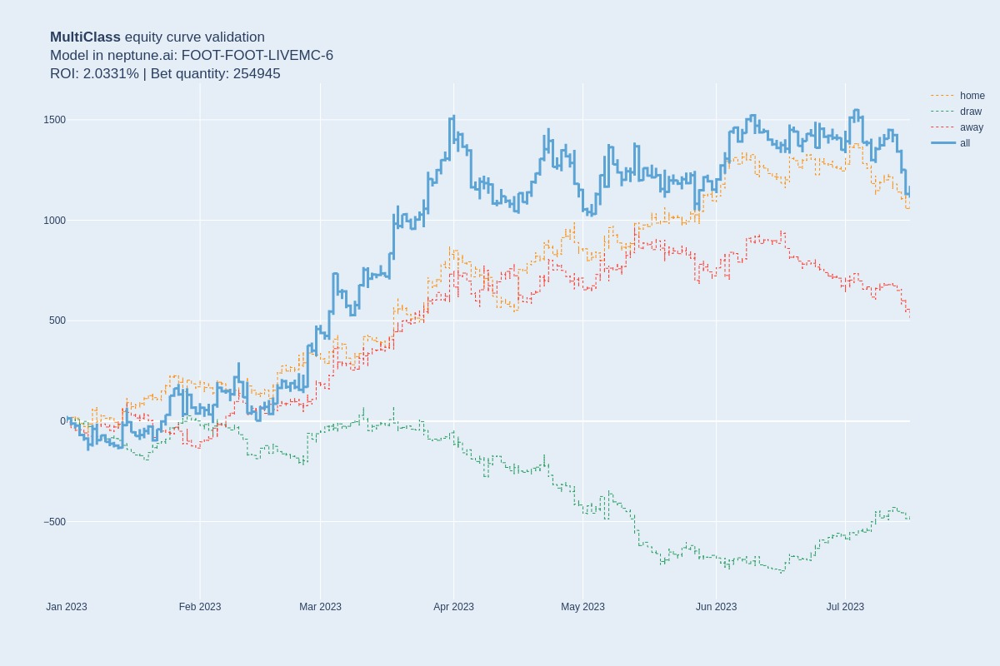

In [59]:
from IPython.display import Image, display
display(Image(filename = image_name))

In [61]:
with open(image_name, 'rb') as f:
    y.upload(f, f'disk:/sport_prediction/calcio_2021/uploads/{date_upload}/multiclass_probabilities_folded.jpeg')

### Betting Strategies

##### Functions

In [62]:
def bet_open(match_id_dict:dict, match_minute:int, strategy = '5minute', nbets = 3, last_type = None, current_prob = None, prob_thres = 1.05):
    '''
    '''
    if strategy == '5minute':
        if 'last_bet_minute' in match_id_dict:
            if (match_minute - match_id_dict['last_bet_minute']) > 4:
                return True
            else:
                return False
        else:
            return True
    elif strategy == 'nbets':
        if 'nbets' in match_id_dict:
            if match_id_dict['nbets'] >= nbets:
                return False
            else:
                return True
        else:
            return True
    elif strategy == 'changes':
        if 'last_type' in match_id_dict:
            if match_id_dict['last_type'] != last_type:
                return True
            elif (current_prob / match_id_dict['last_prob']) > prob_thres:
                return True
            else:
                return False
        else:
            return True

In [63]:
def plot_strategy(
    preds_dict,
    line_dict,
    y_dict,
    active_rows_dict,
    data_df,
    strategy_type = 'changes', #'nbets' #'5minute'
    neptune_model_version = neptune_model_version,
    data_split = 'validation',
    sel_best_dict = {'home':1.143, 'draw':1.143, 'away':1.143} #{'home':1.1465, 'draw':1.1465, 'away':1.1465}
):

    type2int = {0:'home', 1:'draw', 2:'away'}
    hda_dict = {'all':{'ltype':'solid', 'colors':'rgb(93, 164, 214)', 'line_width':3, 'order':3},
                'home':{'ltype':'dot', 'colors':'rgb(255, 144, 14)', 'line_width':1, 'order':0},
                'draw':{'ltype':'dot', 'colors':'rgb(44, 160, 101)', 'line_width':1, 'order':1},
                'away':{'ltype':'dot', 'colors':'rgb(255, 65, 54)', 'line_width':1, 'order':2}}

    match_live_dict = {}
    output_list = []
    date_list = []
    bet_size_list = []
    preds_int, preds_float = calculate_multiclass(
                                        preds_dict[data_split],
                                        line_dict[data_split]
                                    ).values()
    for pred_win, pred_prob, line, y_true, match_id, \
                    match_time, match_minute, active in tqdm(zip(
            preds_int,
            preds_float,
            line_dict[data_split],
            y_dict[data_split],
            data_df['Id'].values,
            data_df['StatTime'],
            data_df['Minute'].values,
            active_rows_dict[data_split]
                                ), total = active_rows_dict[data_split].shape[0]):
        if active:
            if pred_prob > sel_best_dict[type2int[pred_win]]:
                if match_id not in match_live_dict:
                    match_live_dict[match_id] = {'nbets':0}

                if bet_open(match_live_dict[match_id], match_minute, strategy = strategy_type,
                            nbets = 3,
                            last_type = pred_win, current_prob = pred_prob, prob_thres = 1.01):
                    bet_size = 1 / line[pred_win]
                    if pred_win == y_true:

                        event_list = [0, 0, 0]
                        event_list[pred_win] =  bet_size * (line[pred_win] - 1)
                        output_list.append(event_list)
                        date_list.append(match_time.date())
                        bet_size_list.append(bet_size)
                        match_live_dict[match_id]['last_bet_minute'] = match_minute
                        match_live_dict[match_id]['nbets'] += 1
                        match_live_dict[match_id]['last_type'] = pred_win
                        match_live_dict[match_id]['last_prob'] = pred_prob
                    else:
                        event_list = [0, 0, 0]
                        event_list[pred_win] = -bet_size
                        output_list.append(event_list)
                        date_list.append(match_time.date())
                        bet_size_list.append(bet_size)
                        match_live_dict[match_id]['last_bet_minute'] = match_minute
                        match_live_dict[match_id]['nbets'] += 1
                        match_live_dict[match_id]['last_type'] = pred_win
                        match_live_dict[match_id]['last_prob'] = pred_prob
    layout_dict = {}
    data_list = []
    for hda, value_dict in hda_dict.items():
        if hda != 'all':
            data_list += [
                go.Scatter(
                    x = date_list,
                    y = np.cumsum(np.array(output_list)[:, value_dict['order']]),
                    name = hda,
                    line = dict(color = value_dict['colors'], width = value_dict['line_width'], dash = value_dict['ltype'])
                            )]

    cumsum_all = np.cumsum(np.sum(np.array(output_list), axis = 1))
    data_list += [
        go.Scatter(
            x = date_list,
            y = cumsum_all,
            name = 'all',
            line = dict(color = hda_dict['all']['colors'], width = hda_dict['all']['line_width'], dash = hda_dict['all']['ltype'])
                    )]
    title_text = f'<b>MultiClass</b> equity curve for strategie <b><i>{strategy_type}</i></b>' + \
        f'<br>Model in neptune.ai: FOOT-{neptune_model_version}<br>' + \
        f"ROI: {round(100 * cumsum_all[-1] / sum(bet_size_list), 2)}%" + \
        f' | Bet quantity: {len(output_list)}<br>'
    #dt_min = min(x_date[new_ard])
    #dt_max = max(x_date[new_ard])
    layout_dict.update({
    'width':1200,
    'height':800,
    #'title_x':0.5,
    'title_text':title_text,
    'paper_bgcolor':'rgb(229, 237, 247)',
    'plot_bgcolor':'rgb(229, 237, 247)',
    #'xaxis':{'range':[dt_min, dt_max]}
                    })
    layout = go.Layout(**layout_dict)
    return go.Figure(data=data_list, layout=layout) #, match_live_dict

##### Plot

In [70]:
fig = plot_strategy(
    preds_dict,
    line_dict,
    y_dict,
    active_rows_dict,
    data_df,
    strategy_type = '5minute', #'changes', #'nbets' #'5minute'
    #neptune_model_version = neptune_model_version,
    #data_split = 'validation',
    sel_best_dict = {'home':1.143, 'draw':1.143, 'away':1.143} #{'home':1.1465, 'draw':1.1465, 'away':1.1465}
)
fig.show()

100%|██████████| 2645285/2645285 [00:20<00:00, 129989.61it/s]


In [71]:
image_name = 'multiclass_folded_5minute.jpeg'
fig.write_image('./' + image_name)

In [72]:
with open('./' + image_name, 'rb') as f:
    y.upload(f, f'disk:/sport_prediction/calcio_2021/uploads/{date_upload}/{image_name}')